In [1]:
from ISMgas.nires.NIRESredux import NIRESredux, initNIRES
from ISMgas.GalaxyProperties import GalaxyProperties
from ISMgas.SupportingFunctions import display_image
import glob
import matplotlib.pyplot as plt
from astropy.io import fits
import pprint

In [2]:
filenames = sorted(glob.glob("s*"))
filesToReduce = initNIRES(filenames)

pprint.pp(list(filesToReduce.keys()))

['NAME',
 '23990108',
 '25147703',
 '27765189',
 'desi-293',
 'desi-278',
 'desi-310',
 'desi-329',
 'desi-006',
 'desi-023',
 'desi-023-arc2',
 '306602282',
 '223066247',
 '1135468',
 '266637953',
 '1025141',
 '1097902',
 '1119199',
 'hip13917']


In [3]:
filenames = sorted(glob.glob("v*"))
slitViewer = initNIRES(filenames)

pprint.pp(list(slitViewer.keys()))

['NAME',
 'MIRA PMFM -400',
 '23990108',
 '25147703',
 '27765189',
 'desi-293',
 'desi-278',
 'desi-310',
 'desi-329',
 'desi-006',
 'desi-023',
 'desi-023-arc2',
 '306602282',
 '223066247',
 '1135468',
 '266637953',
 '1025141',
 '1097902',
 '1119199',
 'hip13917']


# desi-006

In [34]:
pprint.pp(list(filesToReduce.keys()))
objid = 'desi-006'

## Print in ABBA pattern 
count = 1
print("A frames")
A = []
for i in filesToReduce[objid]:
    
    if(count in [1,4,5,8,9,12,13,16]):
        A.append(i)
    count+=1
print(A)
print("B frames")

B=[]
for i in filesToReduce[objid]:
    
    if(count in [2,3,6,7,10,11,14,15]):
        B.append(i)
    count+=1
print(B)

print(filesToReduce[objid])
print(slitViewer[objid])

['NAME',
 '23990108',
 '25147703',
 '27765189',
 'desi-293',
 'desi-278',
 'desi-310',
 'desi-329',
 'desi-006',
 'desi-023',
 'desi-023-arc2',
 '306602282',
 '223066247',
 '1135468',
 '266637953',
 '1025141',
 '1097902',
 '1119199',
 'hip13917']
A frames
['s200906_0054.fits', 's200906_0057.fits']
B frames
['s200906_0055.fits', 's200906_0056.fits']
['s200906_0054.fits', 's200906_0055.fits', 's200906_0056.fits', 's200906_0057.fits']
['v200906_0079.fits', 'v200906_0080.fits', 'v200906_0081.fits', 'v200906_0082.fits', 'v200906_0083.fits', 'v200906_0084.fits', 'v200906_0085.fits', 'v200906_0086.fits', 'v200906_0087.fits', 'v200906_0088.fits', 'v200906_0089.fits', 'v200906_0090.fits']


Found 2 image files: 'desi-006_A.fits' and 'desi-006_B.fits'.
Writing to log file 'desi-006_A-06_B.log'.
Open and read FITS file 'desi-006_A.fits'.
Open and read FITS file 'desi-006_B.fits'.
IAB.root='desi-006_A-06_B'
UT date of exposure is '1000-01-01T12:00:00.000'.
Best AVP file match '2017-11-02'.
Using '2017-11-02' date for AVP files.
Read '/home/keerthi/work/nsx/cal/SOP1.dat'.
Read '/home/keerthi/work/nsx/cal/SOP2.dat'.
Read '/home/keerthi/work/nsx/cal/AVP.2017-11-02.dat'.
Read '/home/keerthi/work/nsx/cal/AVPinv.2017-11-02.dat'.
Reading '/home/keerthi/work/nsx/cal/TYC.bin'.
Read in 2539913 Tycho entries.
NOTE: average=113.988344
For 'desi-006_A.fits' the slit offset from nominal calibration is   2.28353 rows.
Find .numpro ..
Profiles for 'desi-006_A'.
Profiles: nso=3  centroid=    2.770     18.464(px) 
Profiles: nso=4  centroid=    3.577     23.847(px) 
Profiles: nso=5  centroid=   14.982     99.883(px) 
Profiles: nso=6  centroid=   14.724     98.163(px) 
Profiles: nso=7  centroid

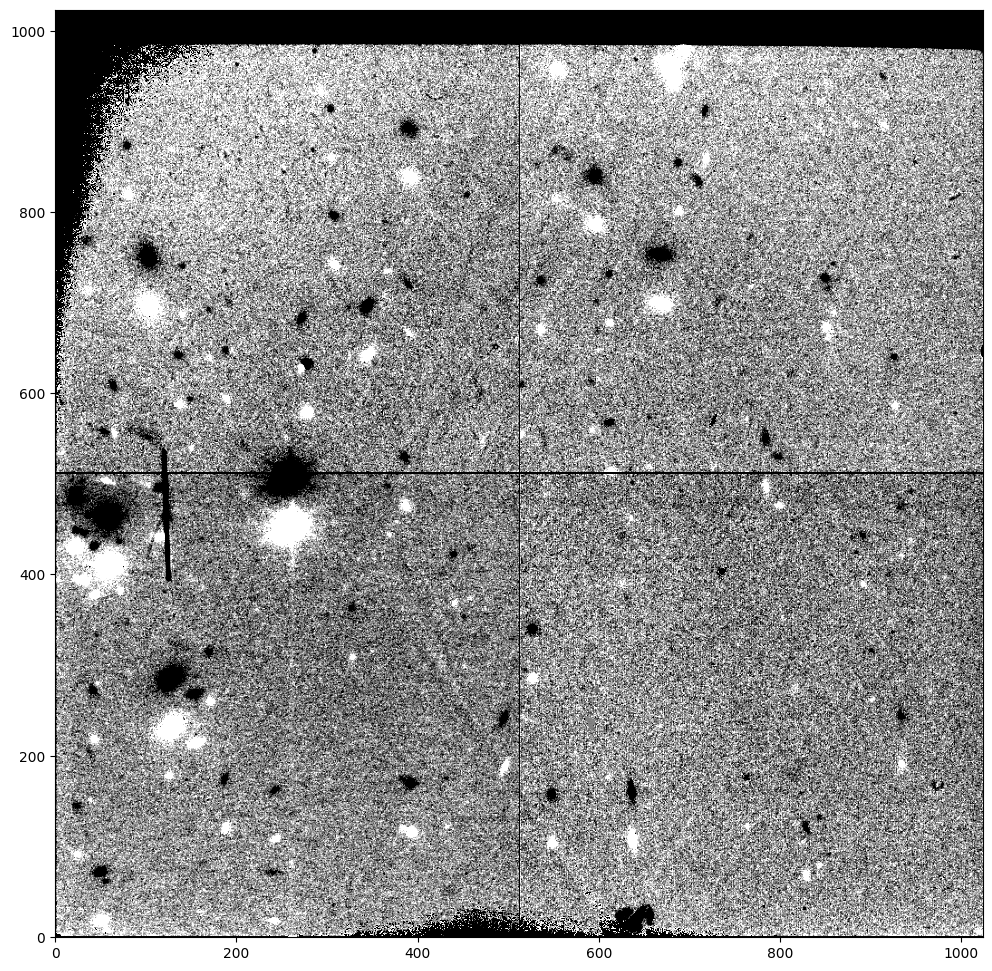

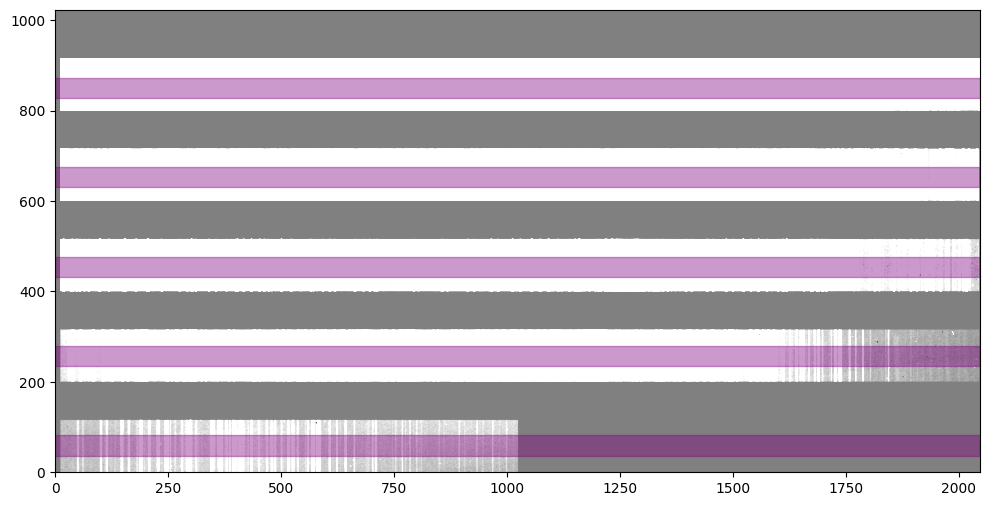

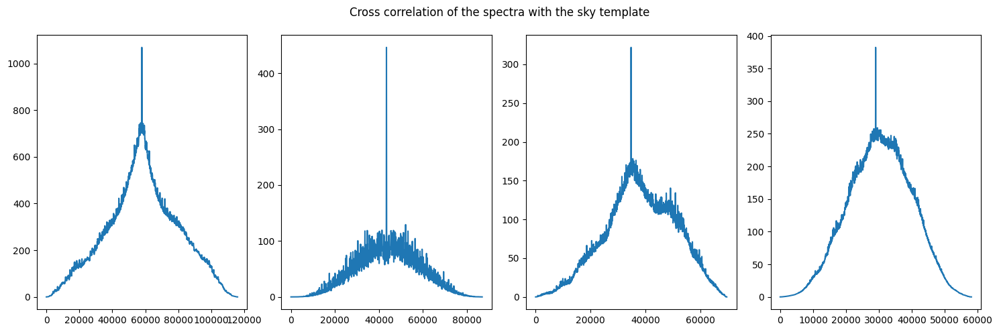

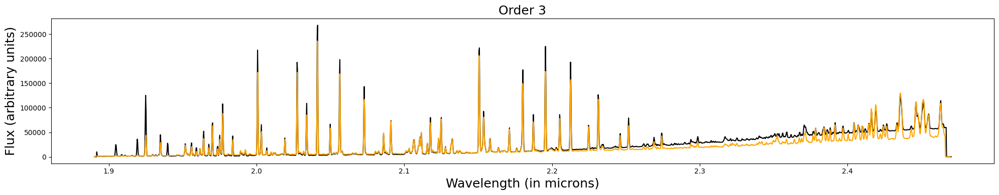

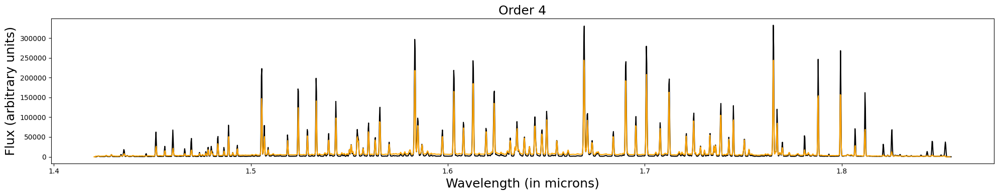

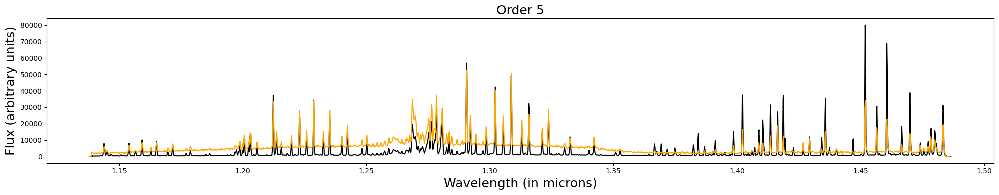

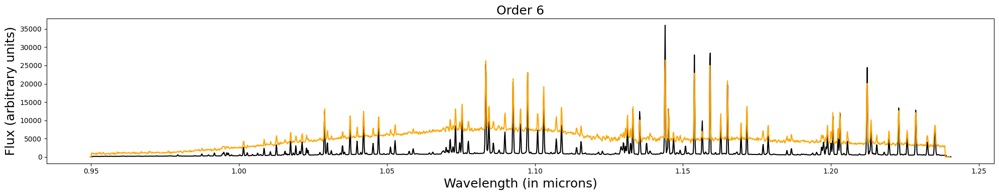

In [35]:
dd = NIRESredux(
    objid=objid,
    baseFolder="",
    A = A,
    B = B,
    slitA= ['v200906_0090.fits','v200906_0087.fits'],
    slitB= ['v200906_0089.fits','v200906_0088.fits']
)


dd.findWavelengthOffset(            
    scalesky = 10000,
    figsize=(20,4),
)



hdr = fits.getheader(slitViewer[objid][-1])
ra = hdr['TARGRA']
dec= hdr['TARGDEC']
print(ra,dec,objid)

In [36]:
dd.plotReducedSpectra(guessZ=2.397
)

1303 512 [O II] 12660.9587
1298 506 [O II] 12670.470299999999
965 668 Hb 16518.5919
809 659 [O III] 16850.1391
732 662 [O III] 17012.855399999997
852 834 Ha 22299.9462
827 832 N-II 22370.2641
667 827 S II 22822.0651
650 826 S II 22870.9819


Offsets from base of slit for A :  3 43
Offsets from base of slit for B :  50 90


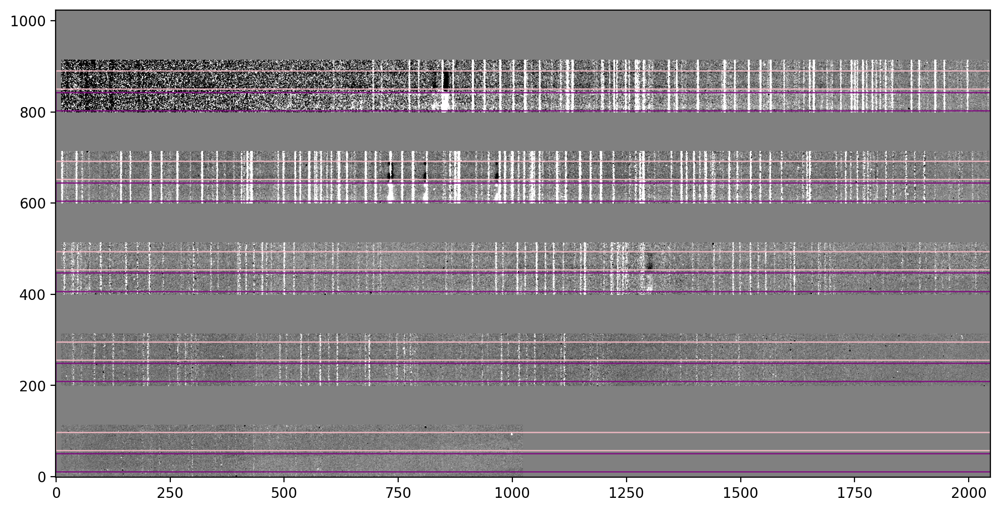

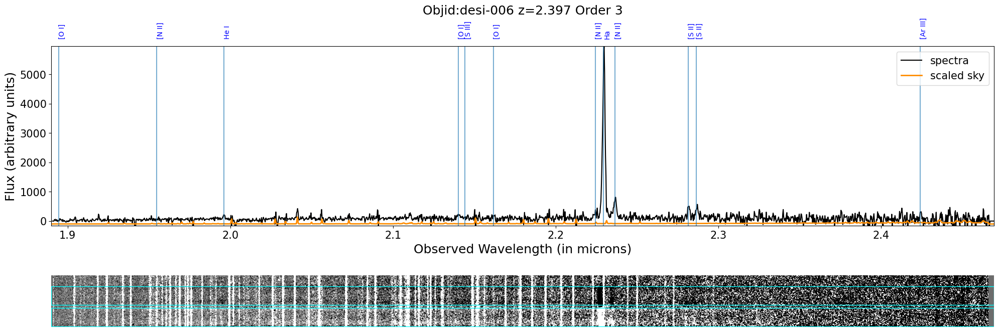

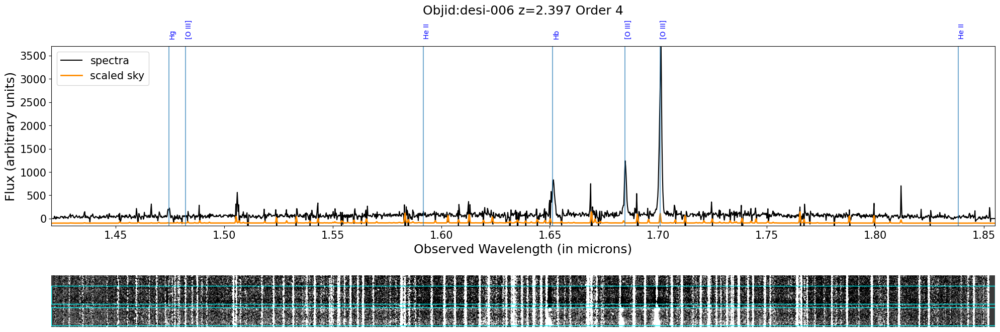

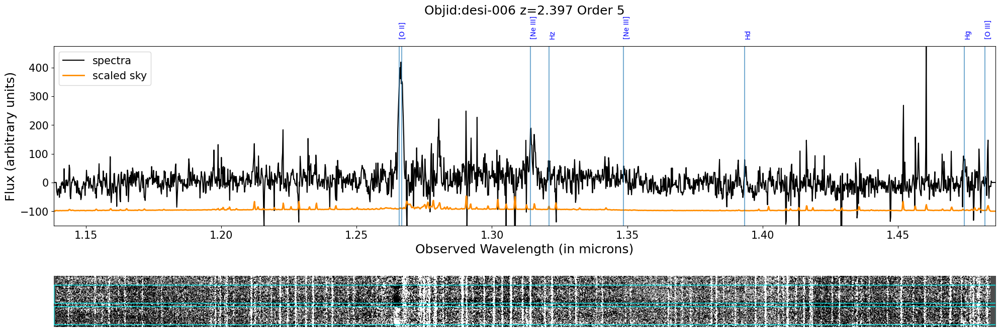

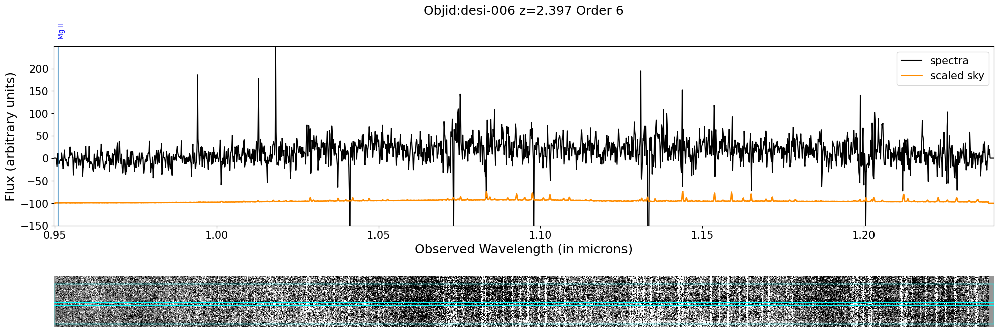

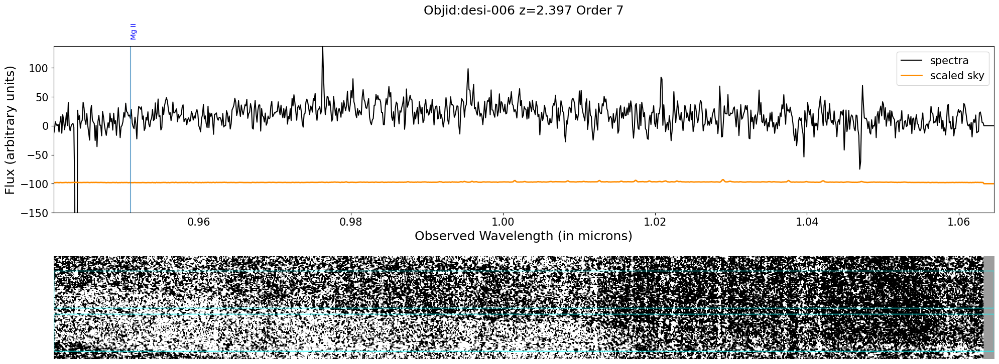

In [37]:
dd.redux1D(
    z=2.397, 
    delta = 47, 
    Amin = 605, 
    Amax = 645, 
)

In [38]:
dd.make2DZoomIn()
dd.save()

Final dataproduct:  {'z': 2.397, 'objid': 'desi-006', 'A': ['s200906_0054.fits', 's200906_0057.fits'], 'B': ['s200906_0055.fits', 's200906_0056.fits'], 'userInputs': {'Amin': 605, 'Amax': 645, 'Bmin': 652, 'Bmax': 692, 'delta': 47, 'order': 'sp4'}, 'slitA': ['v200906_0090.fits', 'v200906_0087.fits'], 'slitB': ['v200906_0089.fits', 'v200906_0088.fits'], 'reducedABFile': 'desi-006_A-06_B-corrected.fits', 'wavOffsetResults': {'wavOffset': -0.0005, 'wavOffsetStd': 0.00012776932339180638, 'offset_vals': {'sp4': -0.00038, 'sp5': -0.00045000000000000004, 'sp6': -0.00055, 'sp7': -0.00072}, 'sky_observed': {'sp4': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'sp5': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'sp6': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'sp7': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)}}, 'wavOffsetArray': [-0.00072, -0.00055, -0.00045000000000000004, -0.00038], 'wavOffset': -0.0005, 'wavOffsetStd': 0.00012776932339180638, 'comments': '',

          ----
  pdfjam: This is pdfjam version 2.08.
  pdfjam: Reading any site-wide or user-specific defaults...
          (none found)
  pdfjam: Effective call for this run of pdfjam:
          /usr/bin/pdfjam --fitpaper 'true' --rotateoversize 'true' --suffix joined --rotateoversize 'false' --outfile desi-006_report.pdf -- desi-006_slitPosition.png - desi-006-1.png - desi-006-2.png - desi-006-3.png - desi-006-4.png - desi-006-5.png - desi-006_2D_zoom.png - 
  pdfjam: Calling pdflatex...
  pdfjam: Finished.  Output was to 'desi-006_report.pdf'.
mkdir: cannot create directory ‘desi-006’: File exists
rm: cannot remove 'desi-006': Is a directory
